# Import libraries

In [367]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Prepare images

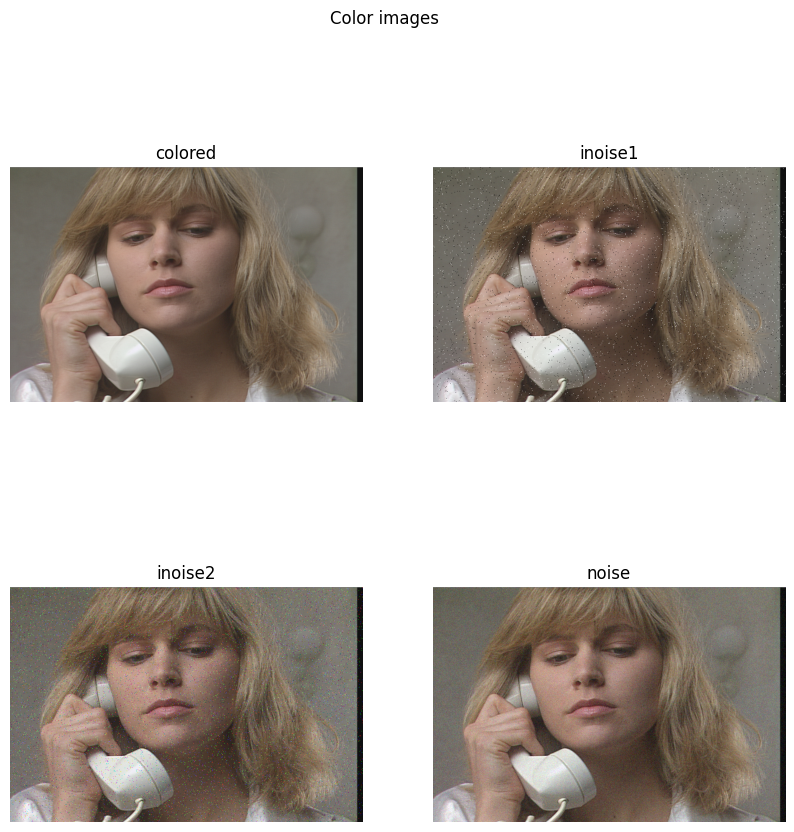

In [ ]:
colored, inoise1, inoise2, noise = None, None, None, None

def calcPSNR(img1, img2):
  imax = 255.**2
  mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size
  return 10.0*np.log10(imax/mse)

def reset_images():
    global colored, inoise1, inoise2, noise
    with open('susie_col.png', 'rb') as f:
        img = cv2.imdecode(np.frombuffer(f.read(), np.uint8), cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        colored = img

    with open('susie_col_inoise.png', 'rb') as f:
        img = cv2.imdecode(np.frombuffer(f.read(), np.uint8), cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        inoise1 = img

    with open('susie_col_inoise2.png', 'rb') as f:
        img = cv2.imdecode(np.frombuffer(f.read(), np.uint8), cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        inoise2 = img

    with open('susie_col_noise.png', 'rb') as f:
        img = cv2.imdecode(np.frombuffer(f.read(), np.uint8), cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        noise = img

reset_images()

plt.figure(figsize=(10, 10))
plt.suptitle('Color images')

for i, img in enumerate([colored, inoise1, inoise2, noise]):
    plt.subplot(2, 2, i+1)
    plt.title(['colored', 'inoise1', 'inoise2', 'noise'][i])
    plt.imshow(img)
    plt.axis('off')

# 1. Color Image Filtering

Implement the filtering operation for a color digital image.  
Use images corrupted with Gaussian and impulse noise for this task.  
Process each input image using a smoothing filter (Gaussian) and a median filter.  
Display each resulting image and calculate its PSNR (relative to the original, noise-free image! The PSNR calculation function is provided in the sample script).  
Evaluate the performance of the filters for mask sizes: 3x3, 5x5, and 7x7.  
Collect the PSNR values in a table for different types of noise, filters, and mask sizes.

---

**Questions to consider:**
- How does the mask size affect the effectiveness of filtering and image distortion?
- Is the subjective assessment of the resulting images consistent with the PSNR values (better quality – higher PSNR)?

# Function to test mask quality

In [369]:
def test_mask_gauss(mask_size: int) -> list:
    colored_copy = colored.copy()
    inoise1_copy = inoise1.copy()
    inoise2_copy = inoise2.copy()
    noise_copy = noise.copy()

    cv2.GaussianBlur(src=colored_copy, ksize=(mask_size, mask_size), sigmaX=0, dst=colored_copy)
    cv2.GaussianBlur(src=inoise1_copy, ksize=(mask_size, mask_size), sigmaX=0, dst=inoise1_copy)
    cv2.GaussianBlur(src=inoise2_copy, ksize=(mask_size, mask_size), sigmaX=0, dst=inoise2_copy)
    cv2.GaussianBlur(src=noise_copy, ksize=(mask_size, mask_size), sigmaX=0, dst=noise_copy)

    pnsr = [calcPSNR(colored, colored_copy), calcPSNR(colored, inoise1_copy), calcPSNR(colored, inoise2_copy), calcPSNR(colored, noise_copy)]

    return [colored_copy, inoise1_copy, inoise2_copy, noise_copy], pnsr

In [370]:
def plot_results(images, pnsr):
    plt.figure(figsize=(10, 10))
    plt.suptitle('Color images')

    for i, img in enumerate(images):
        plt.subplot(2, 2, i+1)
        plt.title(f'{["colored", "inoise1", "inoise2", "noise"][i]} PSNR: {pnsr[i]:.2f}')
        plt.imshow(img)
        plt.axis('off')

# Gauss filter test

## 3x3 mask

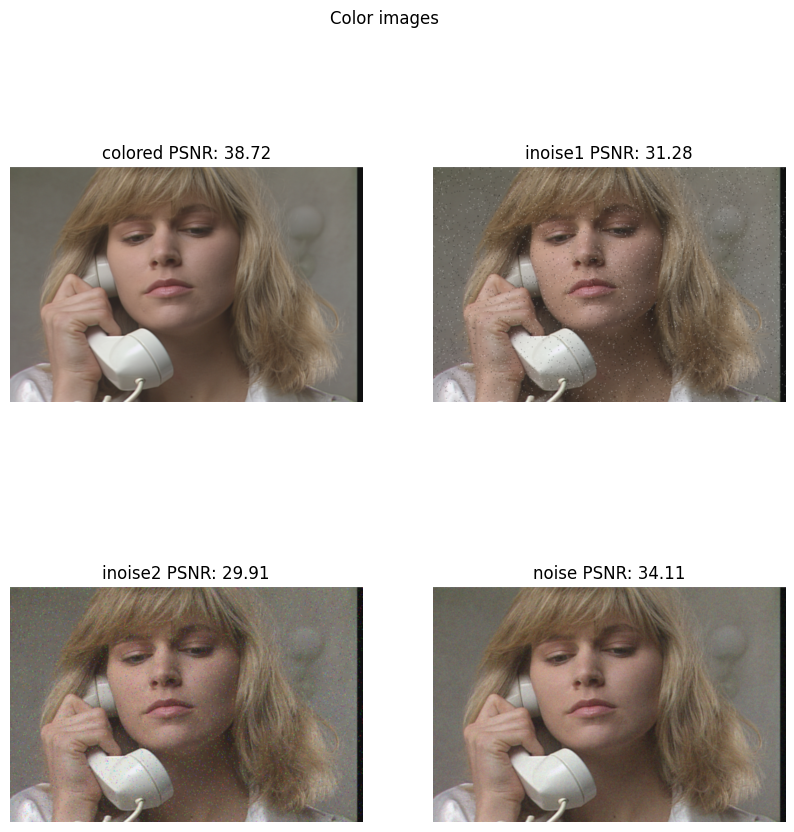

In [371]:
filtered_images, pnsr = test_mask_gauss(3)
plot_results(filtered_images, pnsr)

## 5x5 mask

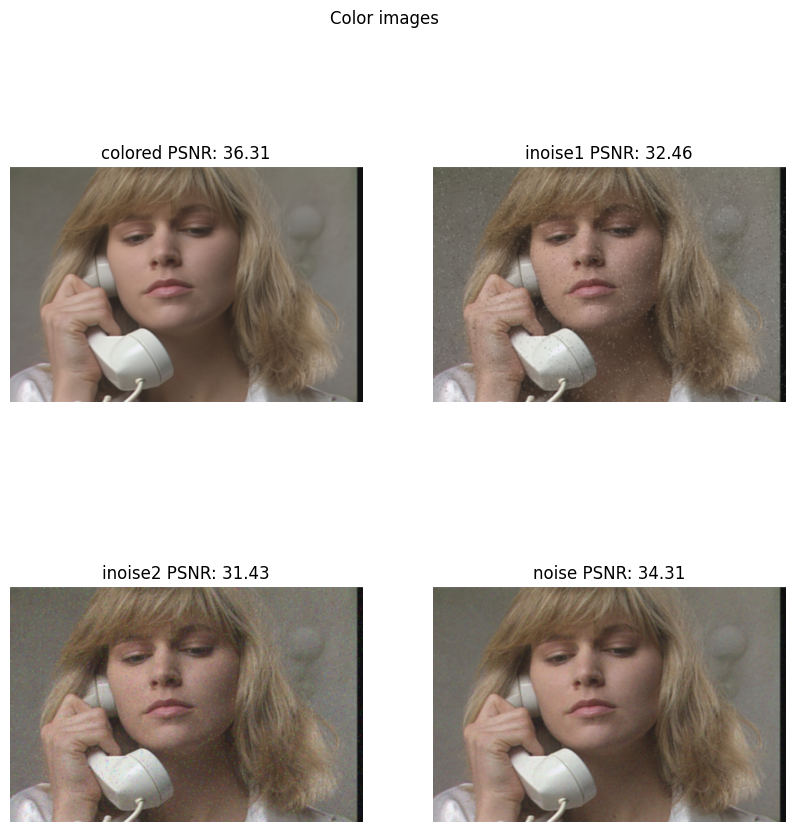

In [372]:
filtered_images, pnsr = test_mask_gauss(5)

plot_results(filtered_images, pnsr)

#   7x7 mask

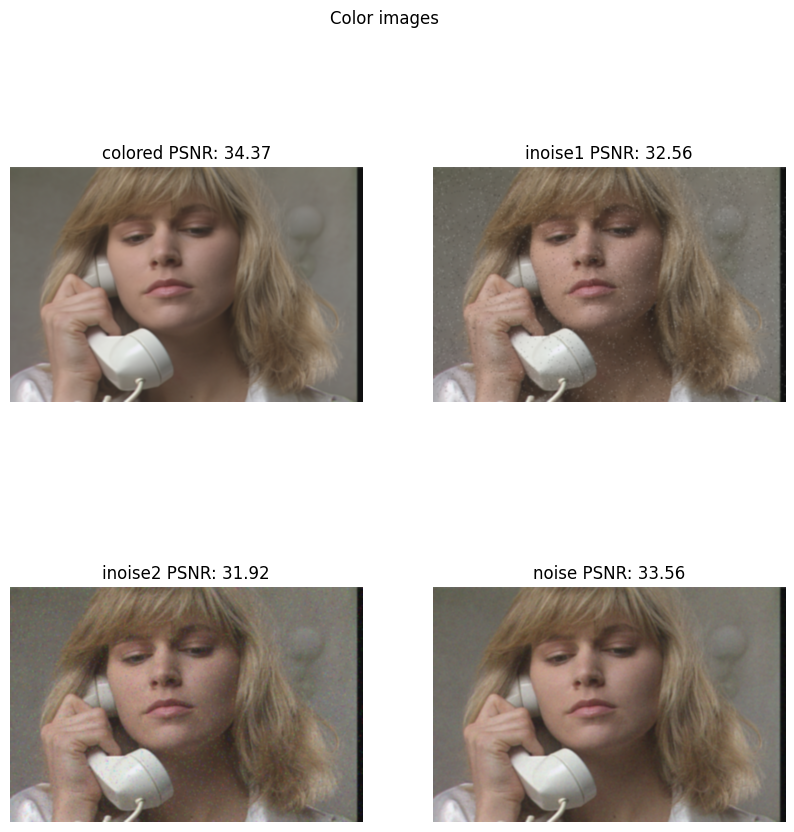

In [373]:
filtered_images, pnsr = test_mask_gauss(7)
plot_results(filtered_images, pnsr)

#   Median Filter

In [374]:
def test_mask_median(mask_size: int): 
    colored_copy = colored.copy()
    inoise1_copy = inoise1.copy()
    inoise2_copy = inoise2.copy()
    noise_copy = noise.copy()

    cv2.medianBlur(src=colored_copy, ksize=mask_size, dst=colored_copy)
    cv2.medianBlur(src=inoise1_copy, ksize=mask_size, dst=inoise1_copy)
    cv2.medianBlur(src=inoise2_copy, ksize=mask_size, dst=inoise2_copy)
    cv2.medianBlur(src=noise_copy, ksize=mask_size, dst=noise_copy)


    pnsr = [calcPSNR(colored, colored_copy), calcPSNR(colored, inoise1_copy), calcPSNR(colored, inoise2_copy), calcPSNR(colored, noise_copy)]

    return [colored_copy, inoise1_copy, inoise2_copy, noise_copy], pnsr




## 3x3 mask

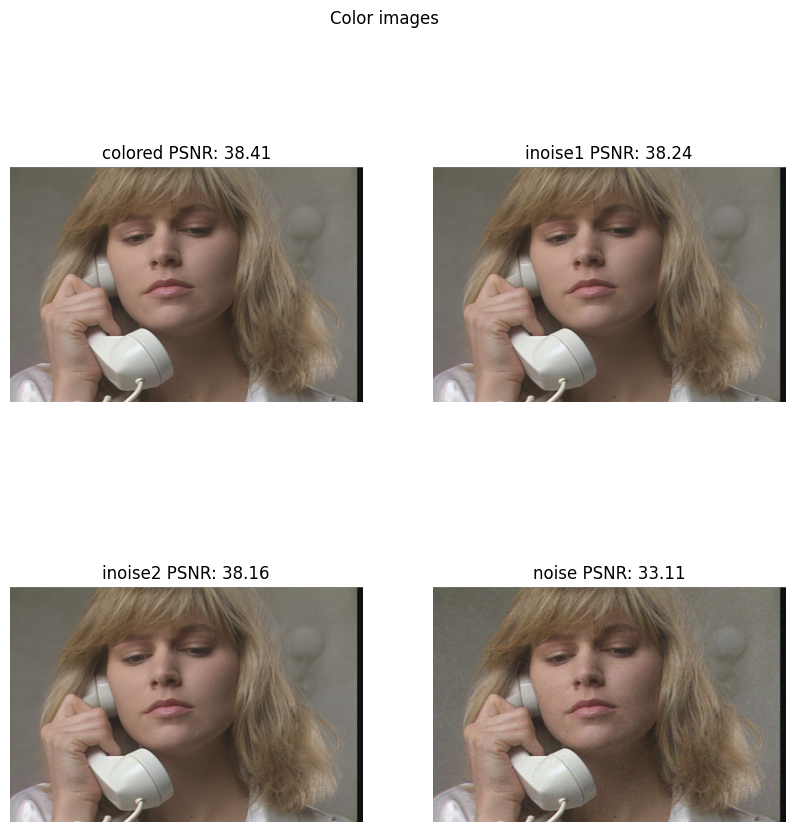

In [375]:
filtered_images, pnsr = test_mask_median(3)
plot_results(filtered_images, pnsr)

##  5x5 mask

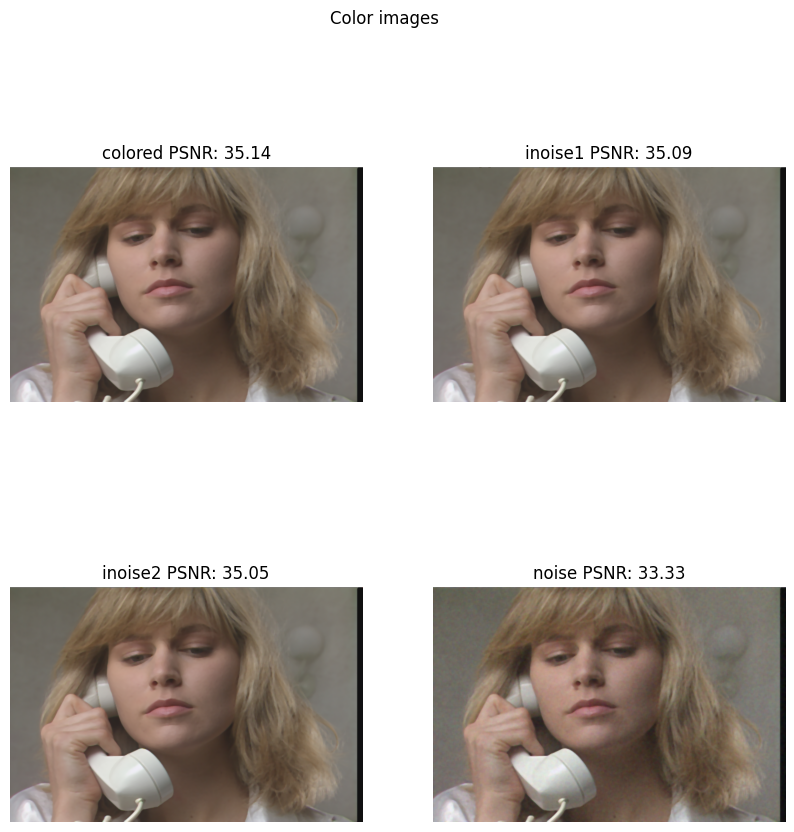

In [376]:
filtered_images, pnsr = test_mask_median(5)
plot_results(filtered_images, pnsr)

##   7x7 mask

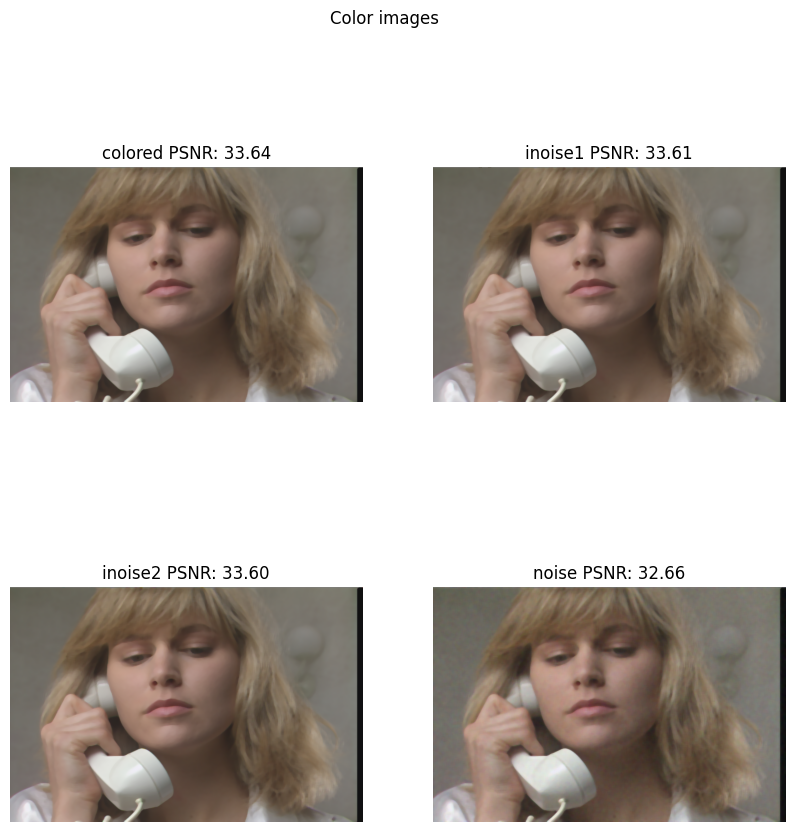

In [377]:
filtered_images, pnsr = test_mask_median(7)
plot_results(filtered_images, pnsr)

#   Comparison

In [378]:
results = {
    'gauss': {
        '3': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        },
        '5': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        },
        '7': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        }
    },
    'median': {
        '3': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        },
        '5': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        },
        '7': {
            'colored': [],
            'inoise1': [],
            'inoise2': [],
            'noise': []
        }
    }
}


for mask_size in [3, 5, 7]:
    filtered_images, pnsr = test_mask_gauss(mask_size)
    results['gauss'][str(mask_size)]['colored'] = pnsr[0]
    results['gauss'][str(mask_size)]['inoise1'] = pnsr[1]
    results['gauss'][str(mask_size)]['inoise2'] = pnsr[2]
    results['gauss'][str(mask_size)]['noise'] = pnsr[3]

    filtered_images, pnsr = test_mask_median(mask_size)
    results['median'][str(mask_size)]['colored'] = pnsr[0]
    results['median'][str(mask_size)]['inoise1'] = pnsr[1]
    results['median'][str(mask_size)]['inoise2'] = pnsr[2]
    results['median'][str(mask_size)]['noise'] = pnsr[3]


print(results)

{'gauss': {'3': {'colored': np.float64(38.71594665655569), 'inoise1': np.float64(31.275537983621934), 'inoise2': np.float64(29.909593449328025), 'noise': np.float64(34.10516279518014)}, '5': {'colored': np.float64(36.30663176447755), 'inoise1': np.float64(32.464962457433735), 'inoise2': np.float64(31.429979195205537), 'noise': np.float64(34.3126475749994)}, '7': {'colored': np.float64(34.365995279815344), 'inoise1': np.float64(32.56159068942487), 'inoise2': np.float64(31.922539544815322), 'noise': np.float64(33.56049681972258)}}, 'median': {'3': {'colored': np.float64(38.40782637398517), 'inoise1': np.float64(38.24370564682194), 'inoise2': np.float64(38.1569304937364), 'noise': np.float64(33.106683893132306)}, '5': {'colored': np.float64(35.142024049791154), 'inoise1': np.float64(35.09275583287652), 'inoise2': np.float64(35.05466124171316), 'noise': np.float64(33.33340515037107)}, '7': {'colored': np.float64(33.641974169750284), 'inoise1': np.float64(33.60665202616034), 'inoise2': np.f

| Filter Type | Mask Size | Colored PSNR | Inoise1 PSNR | Inoise2 PSNR | Noise PSNR |
|-------------|-----------|--------------|--------------|--------------|------------|
| Gauss       | 3         | 38.72        | 31.28        | 29.91        | 34.11      |
| Gauss       | 5         | 36.31        | 32.46        | 31.43        | 34.31      |
| Gauss       | 7         | 34.37        | 32.56        | 31.92        | 33.56      |
| Median      | 3         | 38.41        | 38.24        | 38.16        | 33.11      |
| Median      | 5         | 35.14        | 35.09        | 35.05        | 33.33      |
| Median      | 7         | 33.64        | 33.61        | 33.60        | 32.66      |

## Conclusions

The table above presents PSNR (Peak Signal-to-Noise Ratio) values for different types of filters (Gaussian and median) and mask sizes (3x3, 5x5, 7x7). PSNR is a metric used to assess the quality of a reconstructed image compared to its original version. Higher PSNR values indicate better quality, meaning less noise and distortion.

### Observations:
1. **Gaussian Filter**:
    - As the mask size increases, PSNR values generally decrease. This indicates that larger masks tend to smooth the image more, which may remove more details along with the noise.
    - The highest PSNR values for the Gaussian filter were obtained with the 3x3 mask, suggesting that smaller masks are more effective at preserving image details.

2. **Median Filter**:
    - Similar to the Gaussian filter, increasing the mask size results in lower PSNR values.
    - The median filter shows consistent performance across different types of noise and seems to be more effective for impulse noise.

- **Effect of Mask Size**: Larger mask sizes tend to lower PSNR, indicating a trade-off between noise reduction and detail preservation. Smaller masks retain more details but may be less effective at reducing noise.
- **PSNR**: It can be observed that with higher PSNR, the image is of better quality and more natural, resembling the original.

# 2. Histogram Equalization of a Color Image

➢ Perform histogram equalization on a color image and save the resulting image to a file.  
**Note:** The histogram equalization should be applied only to the brightness (luminance) component. To do this, convert the input RGB image to another color space (e.g., YCbCr/YUV). After equalizing the histogram of the appropriate component, convert the image back to its original format.

Compare the resulting images and their histograms (especially the histogram of the component for which histogram equalization was performed).

Is the image after histogram equalization subjectively of better quality?


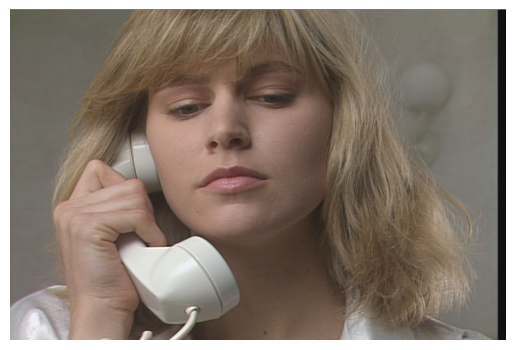

In [379]:
colored_copy = colored.copy()

plt.imshow(colored_copy)
plt.axis('off')
plt.show()

### YCbCr/YUV

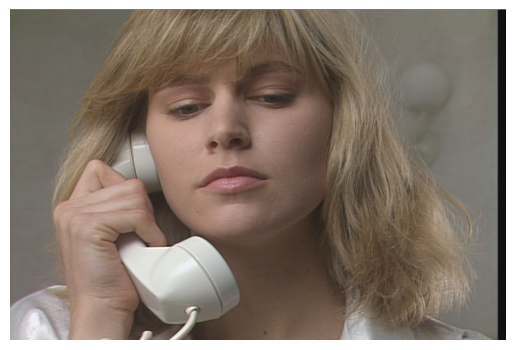

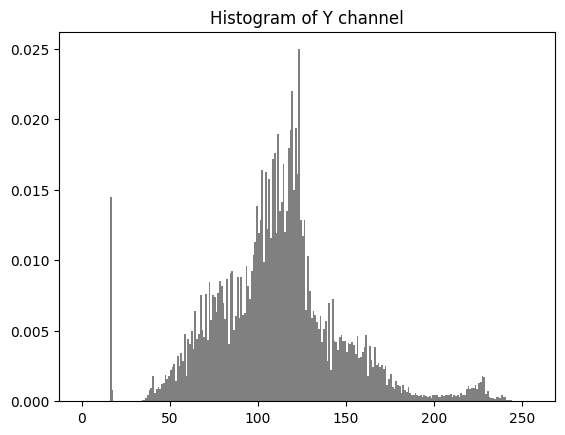

In [380]:
ycbcr = cv2.cvtColor(colored_copy, cv2.COLOR_RGB2YCrCb)

plt.imshow(colored_copy)
plt.axis('off')
plt.show()

hist = ycbcr[..., 0].flatten()
plt.hist(hist, bins=256, range=(0, 256), density=True, color='gray')
plt.title('Histogram of Y channel')
plt.show()

### Histogram Equalization

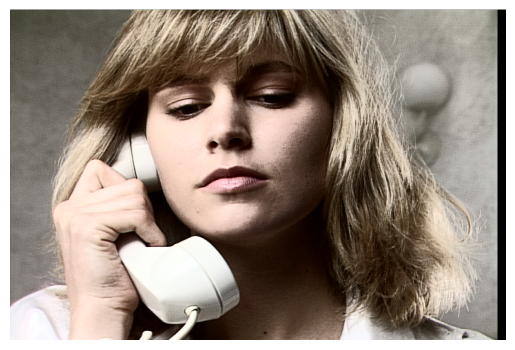

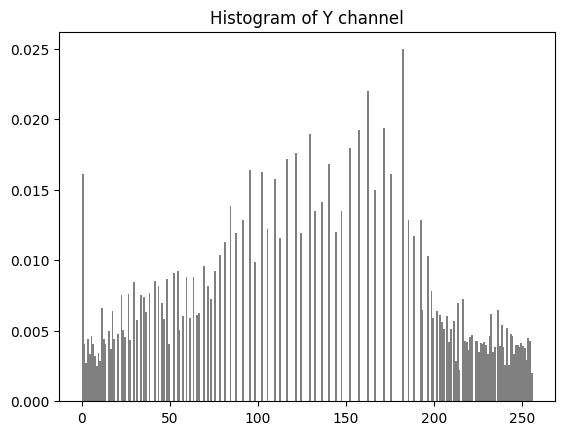

In [381]:
ycbcr[:, :, 0] = cv2.equalizeHist(ycbcr[:, :, 0])

plt.imshow(cv2.cvtColor(ycbcr, cv2.COLOR_YCrCb2RGB))
plt.axis('off')
plt.show()

hist = ycbcr[..., 0].flatten()
plt.hist(hist, bins=256, range=(0, 256), density=True, color='gray')
plt.title('Histogram of Y channel')
plt.show()

## Conclusions

The image after histogram equalization is noticeably of lower quality. Histogram equalization in this case significantly increased the image contrast, making it look very unnatural.

# Task 3: Image Sharpening Using the Laplace Filter

Use the Laplace filter to extract the high-frequency components of an image and perform image sharpening:  
&nbsp;&nbsp;&nbsp;&nbsp;**img_out = img_in + W × img_laplace**  

**Questions:**  
- What is the effect of the high-frequency component weight (W) on the appearance of the resulting image?  
- For which values of W do you obtain good, visually pleasing results?  

**Notes:**  
- Sharpening an image also enhances noise. For images of lower quality, it may be helpful to first smooth the image using a low-pass filter (e.g., Gaussian filter).
- Tip: Use the `cv2.addWeighted()` function to sum the images and simultaneously convert the result to 8-bit integers in the range [0, 255].
- Due to the way Laplacian is computed in OpenCV, to achieve good results, you should subtract the high-frequency image—i.e., use negative values for the weight W.


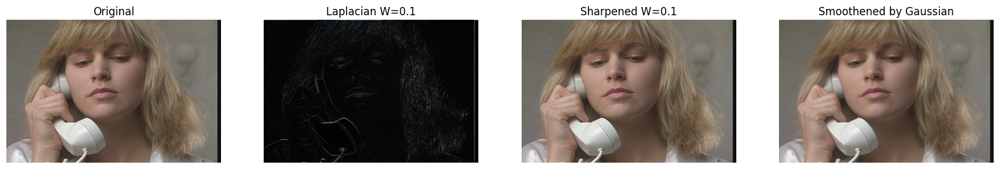

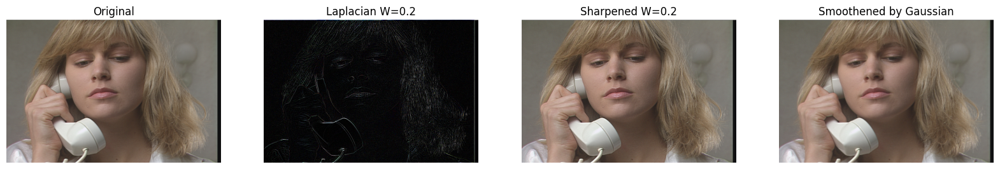

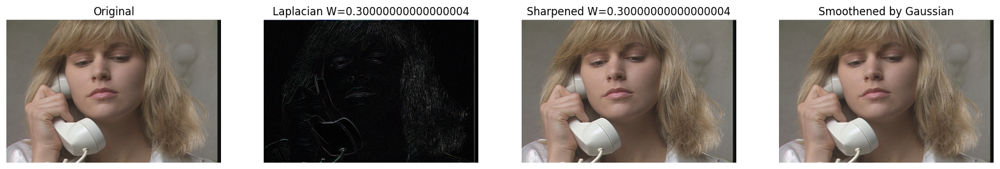

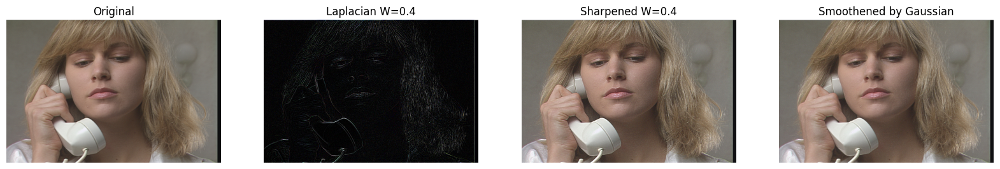

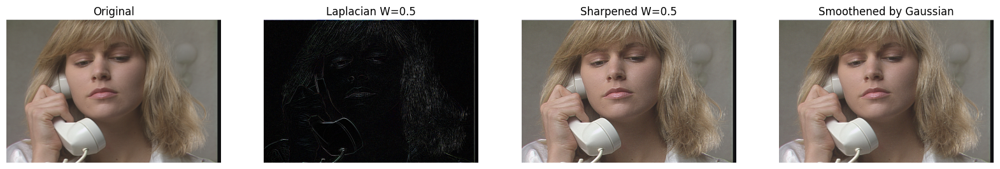

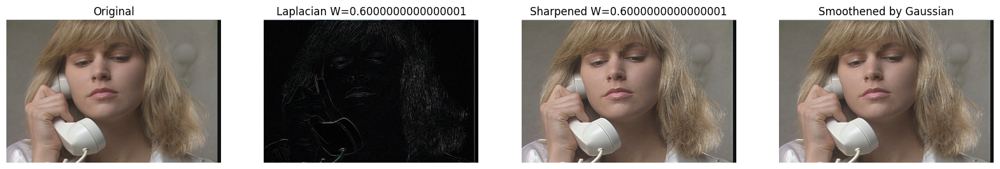

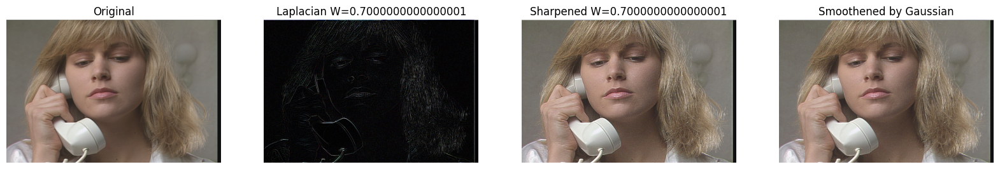

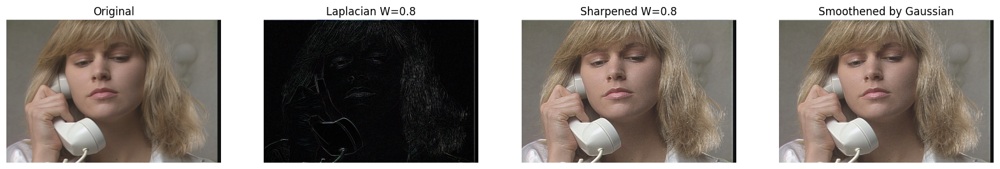

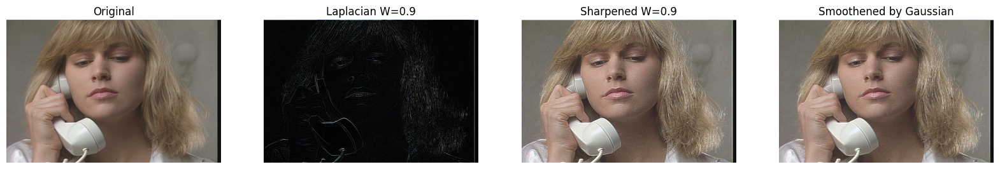

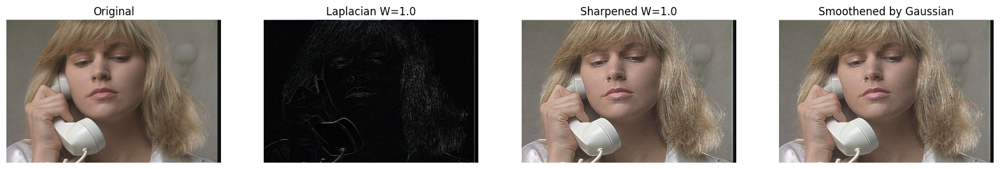

In [382]:
laplace_mask = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

for W in [0.1 * i for i in range(1, 11)]:
    colored_copy = colored.copy()
    laplacian = cv2.filter2D(colored_copy, -1, laplace_mask)
    sharpened = cv2.addWeighted(colored_copy, 1, laplacian, W, 0)
    smoothened = cv2.GaussianBlur(colored_copy, (5, 5), 0)
    smoothened = cv2.addWeighted(smoothened, 1, laplacian, W, 0)

    plt.figure(figsize=(20, 5))
    
    plt.subplot(1, 4, 1)
    plt.imshow(colored_copy)
    plt.axis('off')
    plt.title('Original')

    plt.subplot(1, 4, 2)
    plt.imshow(laplacian)
    plt.axis('off')
    plt.title(f'Laplacian W={W}')

    plt.subplot(1, 4, 3)
    plt.imshow(sharpened)
    plt.axis('off')
    plt.title(f'Sharpened W={W}')
    
    plt.subplot(1, 4, 4)
    plt.imshow(smoothened)
    plt.axis('off')
    plt.title('Smoothened by Gaussian')

    plt.show()


## Conclusions
- The higher the weight, the more sharpened the image becomes.
- With a weight around 0.5, the image still looks fairly natural.
- Applying a Gaussian filter before sharpening slightly improves the quality in this case.